# **Tarea: Análisis Visual de Ventas de Tienda de Conveniencia**

### **Equipo:**
- Wilson David Campos Rojas,
- Katherine Paulina Loyola Leal,
-Bárbara Valentina Pérez Riquelme,
-Jose Miguel Reyes Perez
### **Grupo:** 33
### **Curso:** Visualización de Datos en Python

## Descripción del Caso

Una cadena de tiendas de conveniencia quiere analizar sus ventas y el comportamiento de los clientes para mejorar su estrategia de marketing. Para ello, han recopilado un conjunto de datos que incluye información sobre las ventas, los productos y los clientes. Su misión será usar las técnicas de visualización de datos aprendidas para analizar y presentar los resultados de este conjunto de datos.

## Indicaciones Generales

1.  **Dataset:** Utilizarán el dataset "Supermarket Sales" disponible en Kaggle (data.csv).
2.  **Entorno:** Trabajen según las indicaciones de este notebook.
3.  **Colaboración:** Esta es una tarea grupal. Asegúrense de coordinar el trabajo.
4.  **Streamlit:** Se requiere crear un dashboard interactivo usando la librería Streamlit. Deberán escribir y ejecutar su código como script the python (archivo .py), pero deben también escribir el código en una celda dentro de éste jupyter notebook para su revisión.
5.  **Pensamiento Crítico:** Incluyan reflexiones y justificaciones para sus elecciones de visualización y análisis.
6.  **Entrega:** Entreguen este notebook completado según las indicaciones.

## 1. Selección de Variables y desarrollo de Análisis


a.  Examinen el conjunto de datos proporcionado (`df.info()`, `df.describe()`, `df.columns`).

b.  Identifiquen y **justifiquen** las variables que consideren más relevantes para un análisis significativo del comportamiento de ventas y clientes.

c.  Reflexionen sobre la importancia de cada variable seleccionada en el contexto del caso de estudio (¿Qué preguntas de negocio pueden ayudar a responder?).

## Análisis Requeridos:

1.  **Evolución de las Ventas Totales:**
    *   **Objetivo:** Mostrar cómo han variado las ventas totales (`Total`) a lo largo del tiempo (`Date`).

2.  **Ingresos por Línea de Producto:**
    *   **Objetivo:** Comparar los ingresos (`Total`) generados por cada `Product line`.

3.  **Distribución de la Calificación de Clientes:**
    *   **Objetivo:** Analizar la distribución de las calificaciones (`Rating`) de los clientes.

4.  **Comparación del Gasto por Tipo de Cliente:**
    *   **Objetivo:** Comparar la distribución del gasto total (`Total`) entre clientes `Member` y `Normal`.

5.  **Relación entre Costo y Ganancia Bruta:**
    *   **Objetivo:** Visualizar la relación entre el costo de bienes vendidos (`cogs`) y el ingreso bruto (`gross income`).

6.  **Métodos de Pago Preferidos:**
    *   **Objetivo:** Identificar los métodos de pago (`Payment`) más frecuentes.

7.  **Análisis de Correlación Numérica:**
    *   **Objetivo:** Explorar relaciones lineales entre variables numéricas (`Unit price`, `Quantity`, `Tax 5%`, `Total`, `cogs`, `gross income`, `Rating`).

8.  **Composición del Ingreso Bruto por Sucursal y Línea de Producto:**
    *   **Objetivo:** Mostrar la contribución de cada `Product line` al `gross income` dentro de cada `Branch`.

---

## Requisitos Adicionales:
*   Implementación en Streamlit.
*   Gráficos claros (títulos, etiquetas).
*   Interactividad (filtros) donde sea apropiado.
*   Aplicación de buenas prácticas de visualización (claridad).

<span style="color:green"><b>RESPUESTAS</b></span>


In [1]:
#Descarga de librerias
# !pip install streamlit pyngrok
# !pip install ydata-profiling --quiet


In [2]:
#Librerias
import streamlit as st
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import numpy as np


#ignorar avisos
import warnings
warnings.filterwarnings("ignore")

In [3]:
#importar archivo
file_id = "1Dy_75hdwKS1fG4YtEtfB-Dp3SBLXa9H0"

url= f"https://drive.google.com/uc?export=download&id={file_id}"


df = pd.read_csv(url)

#Ver archivo
df.head(10)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3
5,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,3/25/2019,18:30,Ewallet,597.73,4.761905,29.8865,4.1
6,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,2/25/2019,14:36,Ewallet,413.04,4.761905,20.6520,5.8
7,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,2/24/2019,11:38,Ewallet,735.60,4.761905,36.7800,8.0
8,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,1/10/2019,17:15,Credit card,72.52,4.761905,3.6260,7.2
9,692-92-5582,B,Mandalay,Member,Female,Food and beverages,54.84,3,8.2260,172.7460,2/20/2019,13:27,Credit card,164.52,4.761905,8.2260,5.9


#### 1. Selección de Variables y desarrollo de Análisis

In [4]:
## 1. Selección de Variables y desarrollo de Análisis
# Asegúrate de que la columna 'Date' sea tipo datetime (y convertir el formato)
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
df['Date_fmt'] = df['Date'].dt.strftime('%d/%m/%Y')  # Para mostrarlo en el eje X

#Ver archivo
df.head(10)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Date_fmt
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08,Ewallet,522.83,4.761905,26.1415,9.1,05/01/2019
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29,Cash,76.40,4.761905,3.8200,9.6,08/03/2019
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23,Credit card,324.31,4.761905,16.2155,7.4,03/03/2019
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33,Ewallet,465.76,4.761905,23.2880,8.4,27/01/2019
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37,Ewallet,604.17,4.761905,30.2085,5.3,08/02/2019
5,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,2019-03-25,18:30,Ewallet,597.73,4.761905,29.8865,4.1,25/03/2019
6,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,2019-02-25,14:36,Ewallet,413.04,4.761905,20.6520,5.8,25/02/2019
7,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,2019-02-24,11:38,Ewallet,735.60,4.761905,36.7800,8.0,24/02/2019
8,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,2019-01-10,17:15,Credit card,72.52,4.761905,3.6260,7.2,10/01/2019
9,692-92-5582,B,Mandalay,Member,Female,Food and beverages,54.84,3,8.2260,172.7460,2019-02-20,13:27,Credit card,164.52,4.761905,8.2260,5.9,20/02/2019


#### a.  Examinen el conjunto de datos proporcionado (`df.info()`, `df.describe()`, `df.columns`).



In [5]:
#Información general
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Invoice ID               1000 non-null   object        
 1   Branch                   1000 non-null   object        
 2   City                     1000 non-null   object        
 3   Customer type            1000 non-null   object        
 4   Gender                   1000 non-null   object        
 5   Product line             1000 non-null   object        
 6   Unit price               1000 non-null   float64       
 7   Quantity                 1000 non-null   int64         
 8   Tax 5%                   1000 non-null   float64       
 9   Total                    1000 non-null   float64       
 10  Date                     1000 non-null   datetime64[ns]
 11  Time                     1000 non-null   object        
 12  Payment                  1000 non-n

Este DataFrame contiene información sobre 1000 registros relacionados con transacciones comerciales. Entre los puntos claves se encuentra:
- Estructura : posee 1000 filas con un índice de rango de 0 a 999 y 18 columnas que almacenan diversos datos. (*la columna 17 (**Date_fmt**) fue agregada para reformatear la fecha en un formato más accesible*)
- Tipos de datos: se incluyen objetos (*texto*), números flotantes (*float*), enteros (*int*), y una columna de fecha y hora (*datatime*)

Entre las caterogías principales se encuentra:
- Datos de la factura
- Perfil del cliente
- Detalles del producto
- Información financiera
- Detalles de la transaccíon
- Evaluación



In [6]:
#Estadistica descriptiva
df.describe()

,Unit price,Quantity,Tax 5%,Total,Date,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000,1000.00000,1.000000e+03,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,2019-02-14 00:05:45.600000,307.58738,4.761905e+00,15.379369,6.97270
min,10.080000,1.000000,0.508500,10.678500,2019-01-01 00:00:00,10.17000,4.761905e+00,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,2019-01-24 00:00:00,118.49750,4.761905e+00,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,2019-02-13 00:00:00,241.76000,4.761905e+00,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,2019-03-08 00:00:00,448.90500,4.761905e+00,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,2019-03-30 00:00:00,993.00000,4.761905e+00,49.650000,10.00000
std,26.494628,2.923431,11.708825,245.885335,NaN,234.17651,6.131498e-14,11.708825,1.71858


En las estadisticas descriptiva se puede observar lo siguiente:
- El precio unitario ( *Unit price* ) varia enrte 10.08 y 99.96, con un promedio de 55,67.
- La cantidad ( *Quantity* ) comprada por transacción varía entre 1 y 10 unidades.
- El total pagado por compra ( *Total* ) llega hasta 1042,65.
- El ingreso bruto ( *gross income* ) tiene el mmismo promedio que el impuesto ( *Tax 5%* ), ya que es proporcional.
- El *Rating* de clientes promedia 6,97 en una escala de 1 a 10.

In [7]:
#Columnas disponibles
df.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating', 'Date_fmt'],
      dtype='object')

Las columnas que existen en el dataset corresponden a: Invoice ID, Branch, City, Customer, Gender, Product Line, Unit Price, Quantity, Tax 5%, Total, Date, Time, Payment, Cogs, gross margin percentage, gross income y Rating. En resumen, cada columna describen distintas variables asociadas a una compra en particular la cual es codificada con un "invoice ID" que corresponde a un código único para cada transacción. Con esto, se pueden analizar los patrones descritos en cada columna en función de un único consumidor, describiendo su comportamiento en base a variables categóricas como la ciudad donde se efectuo la compra, el sexo del comprador, si es o no un cliente habitual y otras de tipo numérica como los valores del producto comprado, el total de la compra, la fecha y hora de la transacción, entre otras. Con esto, se genera un perfil único para cada comprador y también patrones que pueden ser analizables según sea necesario con cada una de estas variables.

####b. Selección de variables relevantes para el análisis de ventas y clientes

In [8]:
#Analisis EDA de Data Frame
profile = ProfileReport(df, title="Reporte EDA de df", explorative=True)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:00<00:00, 26.26it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

El análisis exploratorio de las variables del dataset, encontró datos correlacionados asociados las variables de las columnas "quantity", "tax 5%", "total", "unit price", "cogs" y "gross income". En el caso de las variables "quantity" y "total", estas se correlacionan de forma positiva en vista de que ambas, influyen directamente en las ganancias del negocio y también en el total de ingresos. A pesar de que entre las variables "tax 5%", "gross income", "cogs" y "total" existe correlación, estas no son relevantes en vista de que el impuesto siempre sera el 5% al total de las venta y también proyecta una curva postiva en función de la cantidad de ventas y cantidad de ingreso bruto.

####c.  Reflexionen sobre la importancia de cada variable seleccionada en el contexto del caso de estudio (¿Qué preguntas de negocio pueden ayudar a responder?).

Estas variables permiten responder preguntas clave de negocio como:

- **Ventas y rendimiento:**
  - ¿Qué día o mes genera más ingresos?

  - ¿Qué productos son los más vendidos o los más rentables?

  - ¿Cuál es la evolución de las ventas totales en el tiempo?

- **Perfil del cliente:**

  - ¿Los clientes nuevos compran más o menos que los recurrentes?

  - ¿Existen diferencias en el comportamiento de compra entre hombres y mujeres?

- **Satisfacción y fidelización:**

  - ¿Existe alguna relación entre el rating entregado y el tipo de cliente o la sucursal?

  - ¿El tipo de producto o el método de pago afectan la satisfacción del cliente?

- **Optimización operativa:**

  - ¿Qué ciudad o sucursal es más rentable?

  - ¿Qué formas de pago son más utilizadas y deberían priorizarse?

--------------------------------------------------------------------------

1.  **Evolución de las Ventas Totales:**
    *   **Objetivo:** Mostrar cómo han variado las ventas totales (`Total`) a lo largo del tiempo (`Date`).

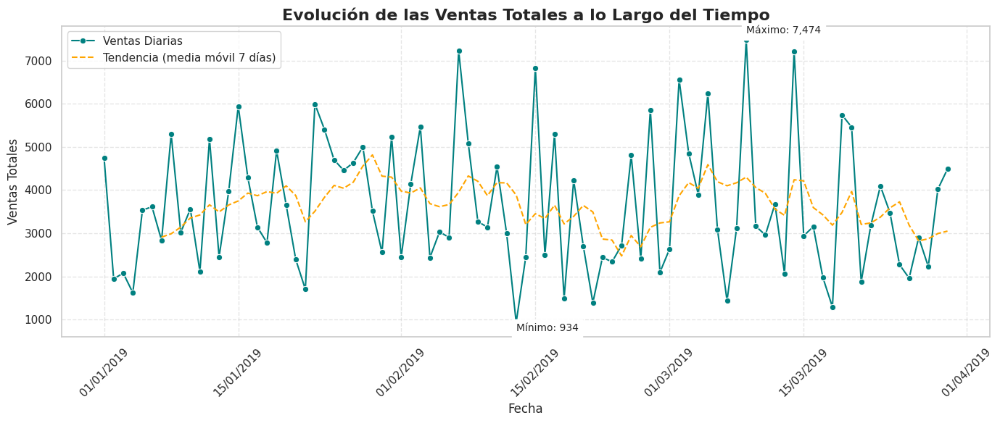

In [9]:
# Agrupar ventas por fecha
sales_over_time = df.groupby('Date')['Total'].sum().reset_index()

# Calcular media móvil
sales_over_time['Rolling Mean'] = sales_over_time['Total'].rolling(window=7).mean()

# Encontrar valor máximo
max_row = sales_over_time.loc[sales_over_time['Total'].idxmax()]
max_date = max_row['Date']
max_value = max_row['Total']

# Encontrar valor mínimo
min_row = sales_over_time.loc[sales_over_time['Total'].idxmin()]
min_date = min_row['Date']
min_value = min_row['Total']

# Estilo
sns.set(style="whitegrid", palette="pastel")

# Crear gráfico
plt.figure(figsize=(14, 6))
sns.lineplot(data=sales_over_time, x='Date', y='Total', label='Ventas Diarias', color='teal', marker='o')
sns.lineplot(data=sales_over_time, x='Date', y='Rolling Mean', label='Tendencia (media móvil 7 días)', color='orange', linestyle='--')

# Formato del eje X
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d/%m/%Y'))
plt.xticks(rotation=45)

# Anotación del máximo
plt.annotate(f'Máximo: {max_value:,.0f}',
             xy=(max_date, max_value),
             xytext=(max_date, max_value + 150),
             arrowprops=dict(facecolor='green', arrowstyle='->'),
             fontsize=10, backgroundcolor='white')

# Anotación del mínimo
plt.annotate(f'Mínimo: {min_value:,.0f}',
             xy=(min_date, min_value),
             xytext=(min_date, min_value - 200),
             arrowprops=dict(facecolor='red', arrowstyle='->'),
             fontsize=10, backgroundcolor='white')

# Títulos y etiquetas
plt.title('Evolución de las Ventas Totales a lo Largo del Tiempo', fontsize=16, fontweight='bold')
plt.xlabel('Fecha', fontsize=12)
plt.ylabel('Ventas Totales', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

# Leyenda y ajuste
plt.legend()
plt.tight_layout()
plt.show()


El gráfico presenta la dinámica de las ventas diarias entre el 1 de enero y el 1 de abril de 2019.  Las ventas presentan una fuerte variación, con un máximo de 7,474 unidades y un mínimo de 934. Estas fluctuaciones podrían estar relacionadas con factores internos y externos, como días festivos, condiciones climáticas, eventos locales, promociones o cambios en la oferta de productos.
La línea de tendencia (media móvil de 7 días) reduce la variabilidad y ayuda a identificar patrones generales. Se notan fases de crecimiento seguidas de caídas, lo que sugiere posibles ciclos o estacionalidades a analizar.
Esta información es clave para ajustar la estrategia de marketing, permitiendo optimizar campañas promocionales en momentos de alta demanda y reforzando las ventas en los periodos de baja.

___________________________________________________________________________________________________


2.  **Ingresos por Línea de Producto:**
    *   **Objetivo:** Comparar los ingresos (`Total`) generados por cada `Product line`.

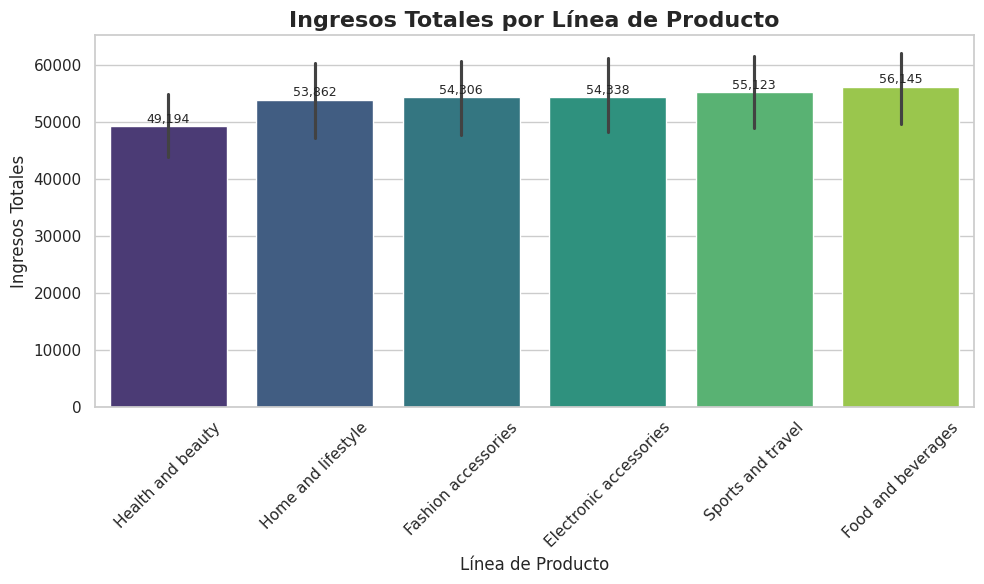

In [10]:
# Estilo visual
sns.set(style="whitegrid", palette="muted")

# Ordenar las líneas de producto de menor a mayor según ingreso total
order = df.groupby('Product line')['Total'].sum().sort_values(ascending=True).index
grouped = df.groupby('Product line')['Total'].sum().reindex(order)

# Crear gráfico
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='Product line', y='Total', estimator=sum, palette='viridis', order=order)

# Títulos y etiquetas
plt.title('Ingresos Totales por Línea de Producto', fontsize=16, fontweight='bold')
plt.xlabel('Línea de Producto', fontsize=12)
plt.ylabel('Ingresos Totales', fontsize=12)
plt.xticks(rotation=45)

# Etiquetas numéricas encima de las barras
for index, value in enumerate(grouped):
    plt.text(index, value + 20, f'{value:,.0f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


Según los datos graficados, se observa que aquellas asociadas a las líneas de belleza y salud, son las que menor cantidad de ingresos generan, pudiendo eventualmente ser las mas costosas y por tanto generar un menor numero de ventas. El resto de las líneas de producto se mantienen con un numero de ventas similar entre sí, destacando las comidas y bebestibles, y ropa, que por ser productos de primera necesidad, pueden explicar la mayor cantidad de ingresos entre los grupos analizados.

-------------------------------------------------------------------------------

3.  **Distribución de la Calificación de Clientes:**
    *   **Objetivo:** Analizar la distribución de las calificaciones (`Rating`) de los clientes.

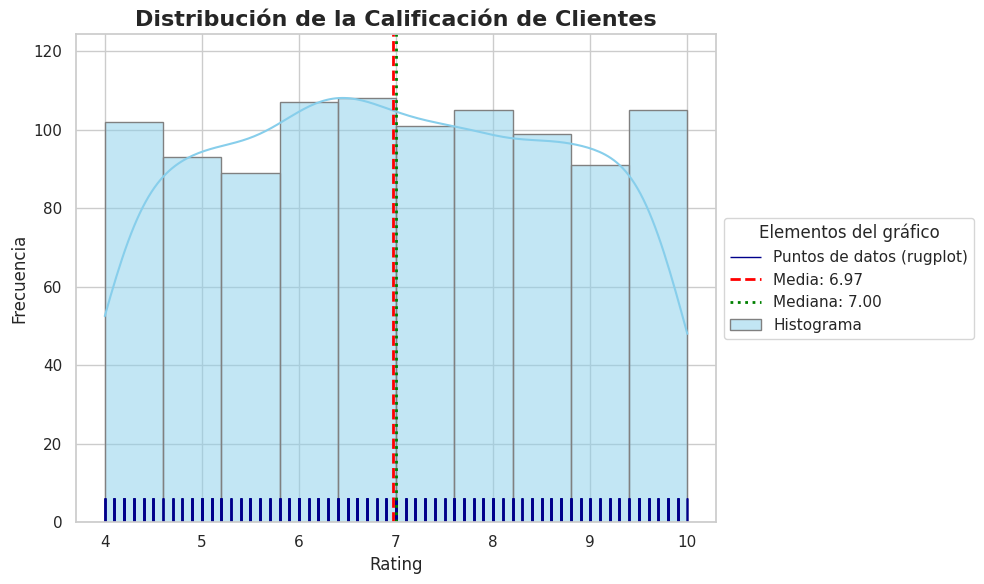

In [11]:
# Calcular estadísticas clave
mean_rating = df['Rating'].mean()
median_rating = df['Rating'].median()

# Estilo
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))

# Histograma con KDE y rugplot
sns.histplot(df['Rating'], bins=10, kde=True, color='skyblue', edgecolor='gray', label='Histograma')
sns.rugplot(df['Rating'], height=0.05, color='darkblue', label='Puntos de datos (rugplot)')

# Líneas de media y mediana
plt.axvline(mean_rating, color='red', linestyle='--', linewidth=2, label=f'Media: {mean_rating:.2f}')
plt.axvline(median_rating, color='green', linestyle=':', linewidth=2, label=f'Mediana: {median_rating:.2f}')

# Títulos y etiquetas
plt.title('Distribución de la Calificación de Clientes', fontsize=16, fontweight='bold')
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# # Leyenda clara para todos los elementos
# plt.legend(title='Elementos del gráfico')

# Leyenda al costado derecho (fuera del gráfico)
plt.legend(title='Elementos del gráfico', loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

En primer lugar, el gráfico presenta una distribución amplia y relativamente uniforme, con calificaciones que se reparten de manera equilibrada a lo largo de la escala (de 4 a 10). Esto sugiere que las opiniones de los clientes están divididas, aunque tienden ligeramente hacia calificaciones altas, entre 6 y 8.
La media es de 6.97 y la mediana de 7.00, lo que indica una distribución casi simétrica, sin inclinación clara hacia valores muy altos o bajos. Lo que sugiere que la mayoría de los clientes están moderadamente satisfechos. En cuanto a la frecuencia, la mayoría de las calificaciones tienen frecuencias entre 90 y 110, lo que confirma una opinión diversa pero balanceada entre los clientes. Además, el rugplot (línea azul en la base del gráfico) confirma que los datos están bien distribuidos a lo largo de la escala de calificación.
Desde el punto de vista estratégico, estos resultados reflejan un nivel de satisfacción aceptable, pero también revelan que existe una parte importante de clientes con calificaciones más bajas (por debajo de 6), lo cual requiere atención. Al mismo tiempo, la presencia constante de las calificaciones altas (de 8 a 10) indica que existen buenas prácticas que deberían fortalecerse y replicarse en todos los puntos de contacto con el cliente.

_____________________________________________________________________________________

4.  **Comparación del Gasto por Tipo de Cliente:**
    *   **Objetivo:** Comparar la distribución del gasto total (`Total`) entre clientes `Member` y `Normal`.

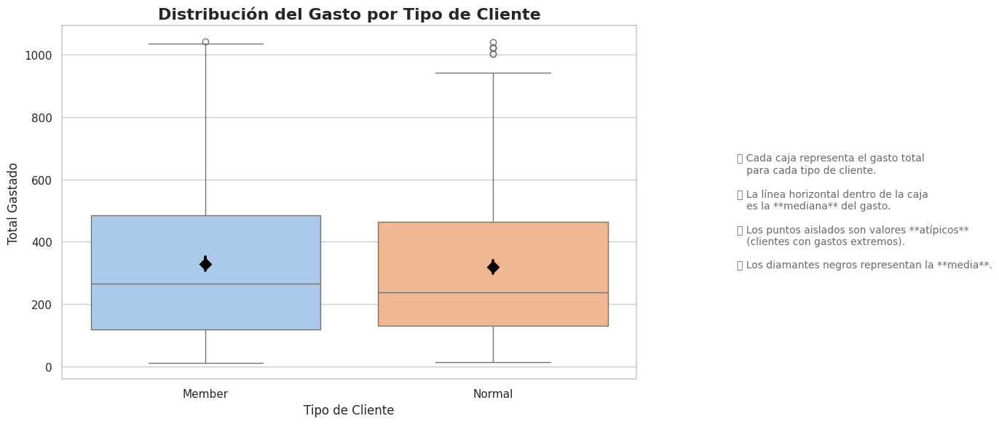

In [12]:
# Estilo visual moderno
sns.set(style="whitegrid")

# Crear la figura
fig, ax = plt.subplots(figsize=(10, 6))

# Colores más suaves y profesionales
palette = sns.color_palette("pastel")

# Boxplot
sns.boxplot(data=df, x='Customer type', y='Total', palette=palette, ax=ax)

# Título y etiquetas
ax.set_title('Distribución del Gasto por Tipo de Cliente', fontsize=16, fontweight='bold')
ax.set_xlabel('Tipo de Cliente', fontsize=12)
ax.set_ylabel('Total Gastado', fontsize=12)

sns.pointplot(data=df, x='Customer type', y='Total', estimator='mean', color='black', join=False, markers='D')


# Anotación explicativa al costado (fuera del gráfico)
fig.text(1.02, 0.5,
         '🔹 Cada caja representa el gasto total\n'
         '   para cada tipo de cliente.\n\n'
         '🔹 La línea horizontal dentro de la caja\n'
         '   es la **mediana** del gasto.\n\n'
         '🔹 Los puntos aislados son valores **atípicos**\n'
         '   (clientes con gastos extremos).\n\n'
         '🔹 Los diamantes negros representan la **media**.',
         fontsize=10, va='center', ha='left', color='dimgray')


# Ajustar para que quepa todo
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

Los datos graficados en box plot sobre distribución de gasto por tipo de cliente, se observa que en ambos casos, el gasto es similar, con una mediana al rededor de los $250 por cliente. En ambos grupos se genera datos anómalos lo que indica un gasto mayor al promedio, siendo mas altos en el grupo de clientes "normal" de lo que se puede inferir un gasto excepcional de mayor valor. El grupo "member" tiene un rango mayor de gasto, lo que puede demostrar un mayor numero de compras o de distintos valores.

_____________________________________________________________________

5.  **Relación entre Costo y Ganancia Bruta:**
    *   **Objetivo:** Visualizar la relación entre el costo de bienes vendidos (`cogs`) y el ingreso bruto (`gross income`).


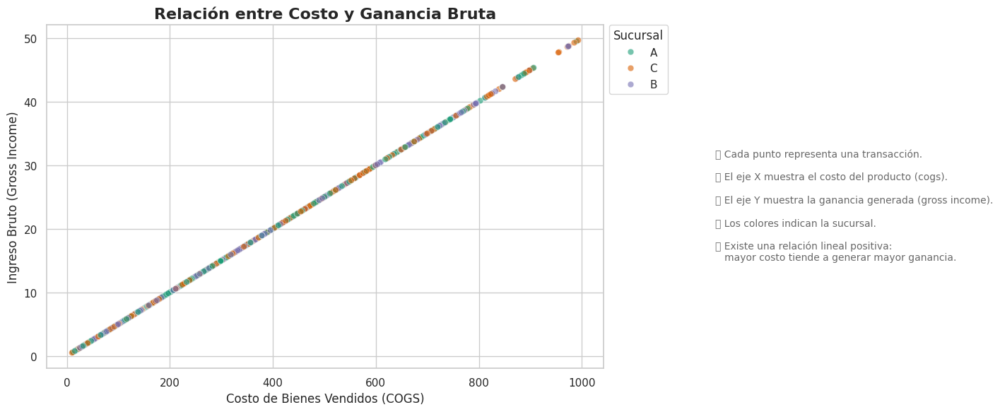

In [13]:
# Estilo moderno
sns.set(style="whitegrid")

# Crear figura y ejes
fig, ax = plt.subplots(figsize=(10, 6))

# Scatterplot con mejoras visuales
sns.scatterplot(
    data=df,
    x='cogs',
    y='gross income',
    hue='Branch',
    palette='Dark2',
    alpha=0.6,
    s=40,
    edgecolor='w',
    linewidth=0.5,
    ax=ax
)


# Títulos y etiquetas
ax.set_title('Relación entre Costo y Ganancia Bruta', fontsize=16, fontweight='bold')
ax.set_xlabel('Costo de Bienes Vendidos (COGS)', fontsize=12)
ax.set_ylabel('Ingreso Bruto (Gross Income)', fontsize=12)

# Anotación explicativa al costado
fig.text(1.02, 0.5,
         '🔹 Cada punto representa una transacción.\n\n'
         '🔹 El eje X muestra el costo del producto (cogs).\n\n'
         '🔹 El eje Y muestra la ganancia generada (gross income).\n\n'
         '🔹 Los colores indican la sucursal.\n\n'
         '🔹 Existe una relación lineal positiva:\n'
         '   mayor costo tiende a generar mayor ganancia.',
         fontsize=10, va='center', ha='left', color='dimgray')

# Ajustar espacio para que quepa la explicación
plt.tight_layout(rect=[0, 0, 0.88, 1])
plt.legend(title='Sucursal', bbox_to_anchor=(1.01, 1), borderaxespad=0)
plt.show()

En este gráfico se observa que a mayor costo de bienes vendidos, genera un mayor ingreso bruto lo cual es consistente con lo explicado en las variables de correlación anteriormente. Además, con una tarifa fija de impuestos (5%), existe un valor constante que, independiente del costo del bien adquirido, no presenta una variación en su precio final.

_________________________________________

6.  **Métodos de Pago Preferidos:**
    *   **Objetivo:** Identificar los métodos de pago (`Payment`) más frecuentes.


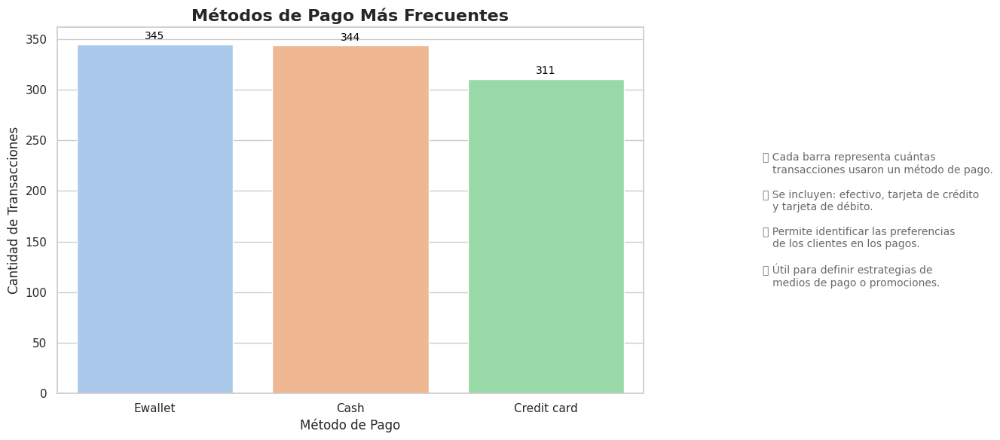

In [14]:
# Estilo moderno
sns.set(style="whitegrid")

# Crear figura
fig, ax = plt.subplots(figsize=(10, 6))

# Gráfico de conteo ordenado
order = df['Payment'].value_counts().index
sns.countplot(data=df, x='Payment', palette='pastel', order=order, ax=ax)

# Títulos y etiquetas
ax.set_title('Métodos de Pago Más Frecuentes', fontsize=16, fontweight='bold')
ax.set_xlabel('Método de Pago', fontsize=12)
ax.set_ylabel('Cantidad de Transacciones', fontsize=12)

# Agregar etiquetas de conteo encima de las barras
for p in ax.patches:
    count = int(p.get_height())
    ax.annotate(f'{count}', (p.get_x() + p.get_width() / 2, p.get_height() + 5),
                ha='center', fontsize=10, color='black')

# Anotación explicativa al costado
fig.text(1.02, 0.5,
         '🔹 Cada barra representa cuántas\n   transacciones usaron un método de pago.\n\n'
         '🔹 Se incluyen: efectivo, tarjeta de crédito\n   y tarjeta de débito.\n\n'
         '🔹 Permite identificar las preferencias\n   de los clientes en los pagos.\n\n'
         '🔹 Útil para definir estrategias de\n   medios de pago o promociones.',
         fontsize=10, va='center', ha='left', color='dimgray')

# Ajustar diseño para que quepa la explicación
plt.tight_layout(rect=[0, 0, 0.88, 1])
plt.show()


El grafico de barra nos permite observar la frecuencia con la que se utilizaron los tres métodos diferentes de pago al realizar las transacciones. En lo anterior podemos observar como el método Ewallet y Cash registran un número muy similar y alto de transacciones, posicionándolos como los métodos de pago predominantes en este conjunto de datos.
En resumen, este grafico de barra nos permite visualizar de forma rápida y sencilla la distribución de las transacciones según el método de pago, destacando la popularidad del Ewallet y el Cash, sobre la Credit Card.

____________________________________________________________________________________

7.  **Análisis de Correlación Numérica:**
    *   **Objetivo:** Explorar relaciones lineales entre variables numéricas (`Unit price`, `Quantity`, `Tax 5%`, `Total`, `cogs`, `gross income`, `Rating`).

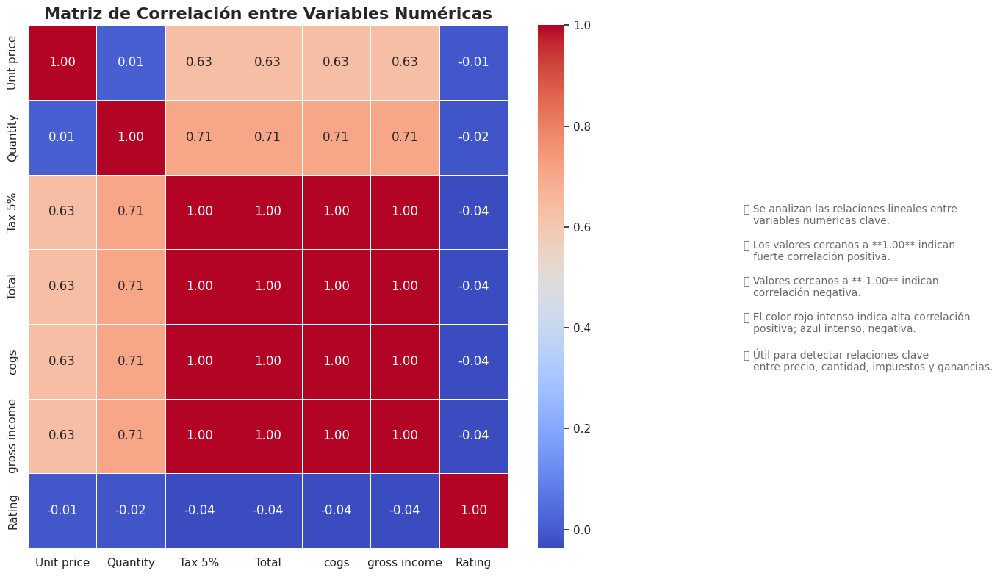

In [15]:
# Importante: seleccionar solo las columnas numéricas relevantes
numeric_cols = ['Unit price', 'Quantity', 'Tax 5%', 'Total', 'cogs', 'gross income', 'Rating']
corr_matrix = df[numeric_cols].corr()

# Estilo visual
sns.set(style="white")

# Crear figura
fig, ax = plt.subplots(figsize=(10, 8))

# Mapa de calor
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5, ax=ax)

# Título
ax.set_title('Matriz de Correlación entre Variables Numéricas', fontsize=16, fontweight='bold')

# Explicación autoexplicativa al costado
fig.text(1.02, 0.5,
         '🔹 Se analizan las relaciones lineales entre\n   variables numéricas clave.\n\n'
         '🔹 Los valores cercanos a **1.00** indican\n   fuerte correlación positiva.\n\n'
         '🔹 Valores cercanos a **-1.00** indican\n   correlación negativa.\n\n'
         '🔹 El color rojo intenso indica alta correlación\n   positiva; azul intenso, negativa.\n\n'
         '🔹 Útil para detectar relaciones clave\n   entre precio, cantidad, impuestos y ganancias.',
         fontsize=10, va='center', ha='left', color='dimgray')

# Ajuste para que quepa todo
plt.tight_layout(rect=[0, 0, 0.88, 1])
plt.show()


El mapa de calor muestra la correlación que existe entre cada una de las variables, en donde se observa que existe una correlación positiva entre aquellas asociadas a los ingresos, cantidad de ventas, ingresos brutos y gastos por consumidor. Sin embargo, aquellas que correlacionan total de ventas, cantidad e ingresos, se puede explicar su correlación positiva debido a que una mayor cantidad de ventas genera a su vez una mayor cantidad de ingresos por lo cual no resulta util generar una correlación de estas variables. Por otra parte, no se logra identificar una correlación en el resto de variables que no están asociadas a los ingreso ya que su valor no muestra una tendencia clara.

___________________________________________________________________________

8.  **Composición del Ingreso Bruto por Sucursal y Línea de Producto:**
    *   **Objetivo:** Mostrar la contribución de cada `Product line` al `gross income` dentro de cada `Branch`.

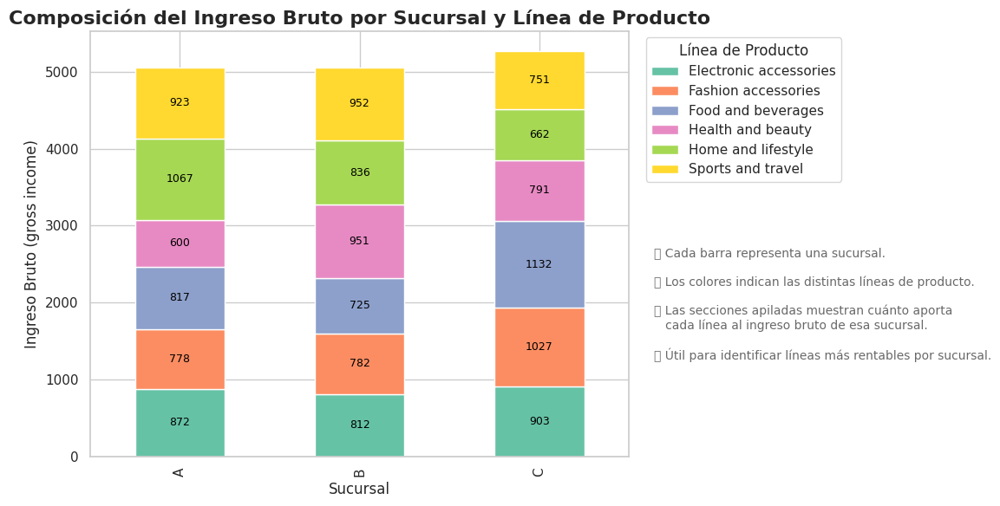

In [16]:
# Agrupar datos
grouped_data = df.groupby(['Branch', 'Product line'])['gross income'].sum().reset_index()

# Pivotear para facilitar el apilamiento
pivot_data = grouped_data.pivot(index='Branch', columns='Product line', values='gross income')

# Estilo visual
sns.set(style="whitegrid")
colors = sns.color_palette("Set2", n_colors=len(pivot_data.columns))

# Crear figura
fig, ax = plt.subplots(figsize=(12, 6))

# Gráfico de barras apiladas
pivot_data.plot(kind='bar', stacked=True, ax=ax, color=colors)

# Agregar los valores encima de cada segmento apilado
for i, branch in enumerate(pivot_data.index):
    cumulative = 0
    for product_line in pivot_data.columns:
        value = pivot_data.loc[branch, product_line]
        if not np.isnan(value) and value > 0:
            cumulative += value
            # Posición del texto: mitad del segmento
            y = cumulative - value / 2
            ax.text(i, y, f'{value:.0f}', ha='center', va='center', fontsize=9, color='black')

# Título y etiquetas
ax.set_title('Composición del Ingreso Bruto por Sucursal y Línea de Producto', fontsize=16, fontweight='bold')
ax.set_xlabel('Sucursal', fontsize=12)
ax.set_ylabel('Ingreso Bruto (gross income)', fontsize=12)
ax.legend(title='Línea de Producto', bbox_to_anchor=(1.02, 1), loc='upper left')

# Explicación autoexplicativa al costado
fig.text(0.62, 0.4,
         '🔹 Cada barra representa una sucursal.\n\n'
         '🔹 Los colores indican las distintas líneas de producto.\n\n'
         '🔹 Las secciones apiladas muestran cuánto aporta\n   cada línea al ingreso bruto de esa sucursal.\n\n'
         '🔹 Útil para identificar líneas más rentables por sucursal.',
         fontsize=10, va='center', ha='left', color='dimgray')

# Ajustar para que no se corte nada
plt.tight_layout(rect=[0, 0, 0.82, 1])
plt.show()


El gráfico presenta la composición del ingreso bruto en tres sucursales (A, B y C). Se evidencia que la sucursal C es la que genera mayores ingresos, lo que refleja un mejor desempeño en ventas. Las categorías de Alimentos y Bebidas, junto con Deportes y Viajes, son las principales fuentes de ingreso en todas las sucursales, lo que demuestra su alta rentabilidad. Aunque las sucursales A y B tiene ingresos más bajos, esto se presenta como una oportunidad para implementar estrategias que fortalezcan su crecimiento, como ciertas prácticas de la sucursal C. Para mejorar el rendimiento general, es fundamental potenciar las líneas de productos más rentables con promociones estratégicas y campañas de marketing adaptadas a los patrones de consumo particulares de cada sucursal. Además, resulta clave impulsar las categorías con menor desempeño, como Salud & Belleza y Accesorios Electrónicos, mediante acciones dirigidas a mejorar su atractivo y posicionamiento. Por último, para permitir una gestión eficiente y un mayor impacto comercial, es recomendable optimizar el inventario asegurando su alineación con la demanda local.

____________________________________________________________

## 2. Integración en un Dashboard (Streamlit)

a.  Utilizando Streamlit, integren **algunas** de sus visualizaciones y hallazgos clave en un dashboard interactivo.

b.  Asegúrense de que el dashboard sea intuitivo y bien organizado (usen títulos, texto explicativo, widgets interactivos como sliders o selectores para filtrar datos).

c.  Reflexionen sobre cómo la interactividad del dashboard mejora la experiencia del usuario y el proceso de toma de decisiones basado en los datos presentados.

**Instrucciones:**
1.  Escriban el código completo de su aplicación Streamlit en la celda de código de abajo.
2.  Copien ese código a un archivo de texto simple llamado `dashboard_tarea.py` (o el nombre que prefieran).
3.  Abran una terminal o Anaconda Prompt, naveguen a la carpeta donde guardaron el archivo.
4.  Ejecuten el comando: `streamlit run dashboard_tarea.py`
5.  Interactúen con su dashboard en el navegador.
6.  **Importante:** En la celda de Markdown siguiente, describan su dashboard, qué visualizaciones incluye, qué interacciones permite, y adjunten el código de su script de python.

In [17]:
# --- Describan su Dashboard (Gráficos Utilizados y Justificación de su uso) ---

''' El dashboard contiene graficos asociados al análisis de variables de evolución de ventas totales,
ingresos por líneas de producto, calificación por los clientes, distribución del gasto por clientes,
relación de costos y ganancias, y ventas asociadas a la ubicación y formas de pago. Entre los esquemas
que se pueden visualizar se encuentran del tipo lineal para correlación, histogramas de frecuencia,
gráficos de barra para visualizar proporciones y boxplots descriptivos. Dentro del panel además se pueden
filtrar por tipo de productos y evaluar su ingreso, por periodos para evaluar las ganancias, trabajar
en base al rating que dan los clientes aplicando filtros de mínimo y máximo, y también visualizar los
gastos efectuados por las distintas categorías de clientes.'''

' El dashboard contiene graficos asociados al análisis de variables de evolución de ventas totales, \ningresos por líneas de producto, calificación por los clientes, distribución del gasto por clientes, \nrelación de costos y ganancias, y ventas asociadas a la ubicación y formas de pago. Entre los esquemas \nque se pueden visualizar se encuentran del tipo lineal para correlación, histogramas de frecuencia, \ngráficos de barra para visualizar proporciones y boxplots descriptivos. Dentro del panel además se pueden\nfiltrar por tipo de productos y evaluar su ingreso, por periodos para evaluar las ganancias, trabajar \nen base al rating que dan los clientes aplicando filtros de mínimo y máximo, y también visualizar los \ngastos efectuados por las distintas categorías de clientes.'

In [18]:
# # # --- CÓDIGO PARA dashboard_tarea_grupo33.py ---
# import streamlit as st
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np

# import warnings
# warnings.filterwarnings("ignore")

# # Cargar datos
# file_id = "1Dy_75hdwKS1fG4YtEtfB-Dp3SBLXa9H0"
# url= f"https://drive.google.com/uc?export=download&id={file_id}"
# df = pd.read_csv(url)

# # Procesar fechas
# df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
# df['Date_fmt'] = df['Date'].dt.strftime('%d/%m/%Y')

# st.title("Análisis Interactivo de Ventas")

# # --- FILTROS ---

# # Filtro rango fechas
# min_date = df['Date'].min()
# max_date = df['Date'].max()
# date_range = st.sidebar.date_input("Seleccione rango de fechas", [min_date, max_date], min_value=min_date, max_value=max_date)

# if len(date_range) == 2:
#     start_date, end_date = date_range
#     df = df[(df['Date'] >= pd.to_datetime(start_date)) & (df['Date'] <= pd.to_datetime(end_date))]

# # Filtro línea de producto
# product_lines = df['Product line'].unique()
# selected_lines = st.sidebar.multiselect("Seleccionar líneas de producto", product_lines, default=product_lines)
# df = df[df['Product line'].isin(selected_lines)]

# # Filtro tipo cliente
# customer_types = df['Customer type'].unique()
# selected_customers = st.sidebar.multiselect("Seleccionar tipo de cliente", customer_types, default=customer_types)
# df = df[df['Customer type'].isin(selected_customers)]

# # Filtro rango rating
# min_rating = float(df['Rating'].min())
# max_rating = float(df['Rating'].max())
# rating_range = st.sidebar.slider("Rango de calificación (Rating)", min_rating, max_rating, (min_rating, max_rating))
# df = df[(df['Rating'] >= rating_range[0]) & (df['Rating'] <= rating_range[1])]

# st.write(f"Datos filtrados: {df.shape[0]} filas")

# # --- GRÁFICOS ---

# # 1. Evolución ventas totales
# st.subheader("1. Evolución de las Ventas Totales")

# sales_over_time = df.groupby('Date')['Total'].sum().reset_index()
# sales_over_time['Rolling Mean'] = sales_over_time['Total'].rolling(window=7, min_periods=1).mean()

# max_row = sales_over_time.loc[sales_over_time['Total'].idxmax()]
# min_row = sales_over_time.loc[sales_over_time['Total'].idxmin()]

# fig, ax = plt.subplots(figsize=(14, 6))
# sns.lineplot(data=sales_over_time, x='Date', y='Total', label='Ventas Diarias', color='teal', marker='o', ax=ax)
# sns.lineplot(data=sales_over_time, x='Date', y='Rolling Mean', label='Tendencia (media móvil 7 días)', color='orange', linestyle='--', ax=ax)

# ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d/%m/%Y'))
# plt.xticks(rotation=45)

# ax.annotate(f'Máximo: {max_row.Total:,.0f}',
#             xy=(max_row.Date, max_row.Total),
#             xytext=(max_row.Date, max_row.Total + 150),
#             arrowprops=dict(facecolor='green', arrowstyle='->'),
#             fontsize=10, backgroundcolor='white')

# ax.annotate(f'Mínimo: {min_row.Total:,.0f}',
#             xy=(min_row.Date, min_row.Total),
#             xytext=(min_row.Date, min_row.Total - 200),
#             arrowprops=dict(facecolor='red', arrowstyle='->'),
#             fontsize=10, backgroundcolor='white')

# ax.set_title('Evolución de las Ventas Totales a lo Largo del Tiempo', fontsize=16, fontweight='bold')
# ax.set_xlabel('Fecha', fontsize=12)
# ax.set_ylabel('Ventas Totales', fontsize=12)
# ax.grid(True, linestyle='--', alpha=0.5)
# ax.legend()
# st.pyplot(fig)

# # 2. Ingresos por Línea de Producto
# st.subheader("2. Ingresos por Línea de Producto")

# order = df.groupby('Product line')['Total'].sum().sort_values(ascending=True).index
# grouped = df.groupby('Product line')['Total'].sum().reindex(order)

# fig, ax = plt.subplots(figsize=(10, 6))
# sns.barplot(data=df, x='Product line', y='Total', estimator=sum, palette='viridis', order=order, ax=ax)

# for index, value in enumerate(grouped):
#     ax.text(index, value + 20, f'{value:,.0f}', ha='center', va='bottom', fontsize=9)

# ax.set_title('Ingresos Totales por Línea de Producto', fontsize=16, fontweight='bold')
# ax.set_xlabel('Línea de Producto', fontsize=12)
# ax.set_ylabel('Ingresos Totales', fontsize=12)
# plt.xticks(rotation=45)
# st.pyplot(fig)

# # 3. Distribución de Calificación de Clientes
# st.subheader("3. Distribución de la Calificación de Clientes")

# mean_rating = df['Rating'].mean()
# median_rating = df['Rating'].median()

# fig, ax = plt.subplots(figsize=(10, 6))
# sns.histplot(df['Rating'], bins=10, kde=True, color='skyblue', edgecolor='gray', label='Histograma', ax=ax)
# sns.rugplot(df['Rating'], height=0.05, color='darkblue', label='Puntos de datos (rugplot)', ax=ax)
# ax.axvline(mean_rating, color='red', linestyle='--', linewidth=2, label=f'Media: {mean_rating:.2f}')
# ax.axvline(median_rating, color='green', linestyle=':', linewidth=2, label=f'Mediana: {median_rating:.2f}')
# ax.set_title('Distribución de la Calificación de Clientes', fontsize=16, fontweight='bold')
# ax.set_xlabel('Rating', fontsize=12)
# ax.set_ylabel('Frecuencia', fontsize=12)
# ax.legend(title='Elementos del gráfico', loc='center left', bbox_to_anchor=(1, 0.5))
# plt.tight_layout()
# st.pyplot(fig)

# # 4. Comparación del Gasto por Tipo de Cliente
# st.subheader("4. Comparación del Gasto por Tipo de Cliente")

# fig, ax = plt.subplots(figsize=(10, 6))
# palette = sns.color_palette("pastel")
# sns.boxplot(data=df, x='Customer type', y='Total', palette=palette, ax=ax)
# sns.pointplot(data=df, x='Customer type', y='Total', estimator='mean', color='black', join=False, markers='D', ax=ax)

# ax.set_title('Distribución del Gasto por Tipo de Cliente', fontsize=16, fontweight='bold')
# ax.set_xlabel('Tipo de Cliente', fontsize=12)
# ax.set_ylabel('Total Gastado', fontsize=12)

# # fig.text(1.02, 0.5,
# #          '🔹 Cada caja representa el gasto total\n'
# #          '   para cada tipo de cliente.\n\n'
# #          '🔹 La línea horizontal dentro de la caja\n'
# #          '   es la **mediana** del gasto.\n\n'
# #          '🔹 Los puntos aislados son valores **atípicos**\n'
# #          '   (clientes con gastos extremos).\n\n'
# #          '🔹 Los diamantes negros representan la **media**.',
# #          fontsize=10, va='center', ha='left', color='dimgray')

# plt.tight_layout(rect=[0, 0, 0.9, 1])
# st.pyplot(fig)

# # 5. Relación entre Costo y Ganancia Bruta
# st.subheader("5. Relación entre Costo y Ganancia Bruta")

# fig, ax = plt.subplots(figsize=(10, 6))
# sns.scatterplot(
#     data=df,
#     x='cogs',
#     y='gross income',
#     hue='Branch',
#     palette='Dark2',
#     alpha=0.6,
#     s=40,
#     edgecolor='w',
#     linewidth=0.5,
#     ax=ax
# )

# ax.set_title('Relación entre Costo y Ganancia Bruta', fontsize=16, fontweight='bold')
# ax.set_xlabel('Costo de Bienes Vendidos (COGS)', fontsize=12)
# ax.set_ylabel('Ingreso Bruto (Gross Income)', fontsize=12)

# # fig.text(1.02, 0.5,
# #          '🔹 Cada punto representa una transacción.\n\n'
# #          '🔹 El eje X muestra el costo del producto (cogs).\n\n'
# #          '🔹 El eje Y muestra la ganancia generada (gross income).\n\n'
# #          '🔹 Los colores indican la sucursal.\n\n'
# #          '🔹 Existe una relación lineal positiva:\n'
# #          '   mayor costo tiende a generar mayor ganancia.',
# #          fontsize=10, va='center', ha='left', color='dimgray')

# plt.tight_layout(rect=[0, 0, 0.9, 1])
# st.pyplot(fig)

# # 6. Sucursales y Métodos de Pago
# st.subheader("6. Ventas por Sucursal y Método de Pago")

# branch_payment = df.groupby(['Branch', 'Payment'])['Total'].sum().unstack().fillna(0)

# fig, ax = plt.subplots(figsize=(12, 6))
# branch_payment.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

# ax.set_title('Ventas Totales por Sucursal y Método de Pago', fontsize=16, fontweight='bold')
# ax.set_xlabel('Sucursal', fontsize=12)
# ax.set_ylabel('Total Ventas', fontsize=12)
# ax.legend(title='Método de Pago', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.xticks(rotation=0)

# # Agregar los valores encima de cada segmento apilado
# for i, branch in enumerate(branch_payment.index):
#     cumulative = 0
#     for payment_method in branch_payment.columns:
#         value = branch_payment.loc[branch, payment_method]
#         if not np.isnan(value) and value > 0:
#             cumulative += value
#             y = cumulative - value / 2
#             ax.text(i, y, f'{value:.0f}', ha='center', va='center', fontsize=9, color='black')

# plt.tight_layout()
# st.pyplot(fig)

# 3. Deployment

a.  Desplieguen su dashboard en Streamlit Cloud.

b.  Asegúrense de que el dashboard sea accesible públicamente.

c.  Proporcionen el enlace al dashboard desplegado en la celda de Markdown siguiente.

d.  Reflexionen sobre el proceso de despliegue y cualquier desafío que hayan enfrentado.


En el caso que no hayan podido deployar:

In [19]:
'''
Comentar si hubo problemas con el código o si no se ejecutó correctamente que les impidieron realizar el análisis completo y el deployment del dashboard.
'''

'\nComentar si hubo problemas con el código o si no se ejecutó correctamente que les impidieron realizar el análisis completo y el deployment del dashboard.\n'

En el caso que hayan podido deployar:

In [20]:
'''
Poner aquí la url de su dashboard en el servidor de Streamlit.
Dasboard Grupo 33: https://visualizaciongrupo33.streamlit.app/
'''

'\nPoner aquí la url de su dashboard en el servidor de Streamlit.\nDasboard Grupo 33: https://visualizaciongrupo33.streamlit.app/\n'

In [21]:
'''El despliegue del dashboard en Streamlit Cloud fue una experiencia enriquecedora.
Uno de los pasos clave fue conectar correctamente el repositorio de GitHub al entorno de Streamlit,
lo cual permitió una integración fluida y automática del código. Aunque al principio hubo algunos
desafíos técnicos relacionados con la instalación de dependencias (como matplotlib y seaborn),
fueron resueltos especificando los paquetes necesarios en el entorno.

Este proceso no solo permitió que el dashboard quedara accesible públicamente con solo un enlace,
sino que también abrió la posibilidad de compartir visualizaciones interactivas de manera muy sencilla.
Además, nos dimos cuenta del potencial que tiene esta herramienta para futuros proyectos, donde se
requiera mostrar resultados de análisis de datos sin depender de plataformas complejas o licencias
costosas. Streamlit junto a GitHub se vuelve una excelente combinación para democratizar la visualización de datos.
'''

'El despliegue del dashboard en Streamlit Cloud fue una experiencia enriquecedora. \nUno de los pasos clave fue conectar correctamente el repositorio de GitHub al entorno de Streamlit, \nlo cual permitió una integración fluida y automática del código. Aunque al principio hubo algunos \ndesafíos técnicos relacionados con la instalación de dependencias (como matplotlib y seaborn), \nfueron resueltos especificando los paquetes necesarios en el entorno.\n\nEste proceso no solo permitió que el dashboard quedara accesible públicamente con solo un enlace, \nsino que también abrió la posibilidad de compartir visualizaciones interactivas de manera muy sencilla. \nAdemás, nos dimos cuenta del potencial que tiene esta herramienta para futuros proyectos, donde se \nrequiera mostrar resultados de análisis de datos sin depender de plataformas complejas o licencias \ncostosas. Streamlit junto a GitHub se vuelve una excelente combinación para democratizar la visualización de datos.\n'

# 4. Conclusiones Generales

Reflexionen sobre el proceso de análisis y visualización. ¿Qué aprendieron sobre los datos de la tienda? ¿Qué limitaciones encontraron en los datos o en las técnicas de visualización? ¿Qué recomendaciones (basadas en los datos) podrían darle a la cadena de tiendas?

In [22]:
'''
El análisis de datos realizado ha permitido obtener una visión profunda del comportamiento de ventas,
productos, clientes y desempeño financiero de la cadena de tiendas. A través de herramientas visuales
utilizadas como gráficos de líneas, barras y mapas de calor, se han identificado patrones clave y relaciones
entre variables que de otro modo habrían sido difíciles de detectar. Los resultados mostraron que las ventas
diarias presentan una alta variabilidad y que existen ciclos estacionales que deben tomarse en cuenta para
optimizar las campañas promocionales. Además, se pudo apreciar la diferencia de rentabilidad entre productos
y las áreas de oportunidad. Se observó también que los clientes "member" tienden a gastar más y que la
satisfacción es moderadamente alta, aunque aún existe un segmento insatisfecho que debe ser atendido.

Sin embargo, el análisis también mostró algunas limitaciones, como la falta de datos sobre factores externos
(como promociones o clima), la duración limitada del período de análisis y la ausencia de detalles más profundos
sobre los tipos de clientes. A pesar de esto, se han generadon varias recomendaciones estratégicas, como optimizar
campañas durante los períodos de alta demanda, reforzar las líneas de productos rentables y mejorar la experiencia
del cliente investigando las causas de la insatisfacción. Además, se recomienda optimizar el desempeño de las sucursales
menos rentables replicando las buenas prácticas de la sucursal C y ajustar el inventario según las preferencias y demandas locales.

Por último, se aconseja priorizar los métodos de pago más populares, como Ewallet y Cash, y mejorar el análisis con
más datos contextuales y un período de estudio más largo. Con estas recomendaciones, la cadena de tiendas puede ajustar
sus estrategias de marketing y operativas para maximizar su rentabilidad y satisfacción del cliente.
'''

'\nEl análisis de datos realizado ha permitido obtener una visión profunda del comportamiento de ventas, \nproductos, clientes y desempeño financiero de la cadena de tiendas. A través de herramientas visuales \nutilizadas como gráficos de líneas, barras y mapas de calor, se han identificado patrones clave y relaciones \nentre variables que de otro modo habrían sido difíciles de detectar. Los resultados mostraron que las ventas \ndiarias presentan una alta variabilidad y que existen ciclos estacionales que deben tomarse en cuenta para \noptimizar las campañas promocionales. Además, se pudo apreciar la diferencia de rentabilidad entre productos \ny las áreas de oportunidad. Se observó también que los clientes "member" tienden a gastar más y que la \nsatisfacción es moderadamente alta, aunque aún existe un segmento insatisfecho que debe ser atendido.\n\nSin embargo, el análisis también mostró algunas limitaciones, como la falta de datos sobre factores externos \n(como promociones o clima)

# 5. Referencias

Listar las fuentes utilizadas (dataset, bibliotecas principales, material de referencia adicional si aplica).

In [23]:
'''
Cairo, A. (2013). The Functional Art: An Introduction to Information Graphics and Visualization. New Riders.

Few, S. (2009). Now You See It: Simple Visualization Techniques for Quantitative Analysis. Analytics Press

Streamlit Inc. (2024). Streamlit documentation. https://docs.streamlit.io/

Waskom, M. L. (2021). seaborn: statistical data visualization. Journal of Open Source Software, 6(60), 3021

Hunter, J. D. (2007). Matplotlib: A 2D Graphics Environment. Computing in Science & Engineering, 9(3), 90–95

GitHub. (2024). About GitHub. https://docs.github.com/en/get-started

VanderPlas, J. (2016). Python Data Science Handbook. O'Reilly Media.
'''

"\nCairo, A. (2013). The Functional Art: An Introduction to Information Graphics and Visualization. New Riders.\n \nFew, S. (2009). Now You See It: Simple Visualization Techniques for Quantitative Analysis. Analytics Press\n\nStreamlit Inc. (2024). Streamlit documentation. https://docs.streamlit.io/\n\nWaskom, M. L. (2021). seaborn: statistical data visualization. Journal of Open Source Software, 6(60), 3021\n\nHunter, J. D. (2007). Matplotlib: A 2D Graphics Environment. Computing in Science & Engineering, 9(3), 90–95\n\nGitHub. (2024). About GitHub. https://docs.github.com/en/get-started\n\nVanderPlas, J. (2016). Python Data Science Handbook. O'Reilly Media.\n"

## NOTA FINAL:
### Asegúrense de sólo subir el jupyter notebook a la plataforma, con un formato del tipo: "Trabajo_Grupo_X.ipynb".
### No es necesario incluir el archivo .py del dashboard, pero sí el código dentro de este cuaderno en el apartado correspondiente.